# Notebook 023: EDA for model training data

This notebook contains EDA to better understand the training data and all engineered features combined for use in this analysis

The response variable is:

       'crime-type'

Features examined in this EDA include:

       'streetlights-night', 'lat', 'lon', 'night', 'tempavg', 'windavg', 'precip', 'snowfall',
       'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday',
       'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec',
       'college-near', 'highschool-near', 'median-age', 'median-income', 'poverty-rate',
       'less-than-high-school-perc', 'bachelor-degree-or-more-perc', 'enrolled-college-perc',
       'commercial-mix-ratio', 'industrial-mix-ratio', 'owner-occupied-ratio',
       'residential-median-value', 'residential-gini-coef', 'commercial-mix-ratio-3yr-cagr',
       'industrial-mix-ratio-3yr-cagr', 'owner-occupied-ratio-3yr-cagr',
       'residential-gini-coef-3yr-cagr', 'residential-median-value-3yr-cagr'

In [2]:
import urllib
import os
import operator
import pathlib
import requests
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from shapely.geometry import Point

from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.linear_model import LassoCV
from sklearn.decomposition import PCA
from sklearn import metrics

import statsmodels.api as sm

from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold

%matplotlib inline

In [3]:
DATA_ROOT = '../data/'
FIGURES_ROOT = '../figures/features'
WRITEDIR_ROOT = '../models/baseline'

READDIR_ROOT = os.path.join(DATA_ROOT, 'processed')
SHAPEDIR_ROOT = os.path.join(DATA_ROOT, 'raw')

readfile_model_X = os.path.join(READDIR_ROOT, 'X_train.csv')
readfile_model_X_scaled = os.path.join(READDIR_ROOT, 'X_train_scaled.csv')
readfile_model_y = os.path.join(READDIR_ROOT, 'y_train.csv')

readfile_zipshapes = os.path.join(SHAPEDIR_ROOT, 'shapefile/zipcodes/ZIP_Codes.shp')
readfile_cityshape = os.path.join(SHAPEDIR_ROOT, 'shapefile/city-boundary/City_of_Boston_Boundary.shp')
readfile_streetshapes = os.path.join(SHAPEDIR_ROOT, 'shapefile/street-segments/Boston_Street_Segments.shp')
readfile_tractshapes = os.path.join(SHAPEDIR_ROOT, 'shapefile/census-tracts/Census_2010_Tracts.shp')
readfile_hoodshapes = os.path.join(SHAPEDIR_ROOT, 'shapefile/boston-neighborhoods/Boston_Neighborhoods.shp')
readfile_zonesubshapes = os.path.join(SHAPEDIR_ROOT, 'shapefile/zoning-subdistricts/Zoning_Subdistricts.shp')
readfile_openshapes = os.path.join(SHAPEDIR_ROOT, 'shapefile/open-spaces/Open_Space.shp')

print(
    'readfile paths for datasets used in this notebook are:\n\t{}\n\t{}\n\t{}\n'.format(
        readfile_model_X, readfile_tractshapes, WRITEDIR_ROOT
    )
)

readfile paths for datasets used in this notebook are:
	../data/processed/X_train.csv
	../data/raw/shapefile/census-tracts/Census_2010_Tracts.shp
	../models/baseline



In [4]:
# mkdir for saving figures if it doesn't already exist
if not os.path.exists(FIGURES_ROOT):
    os.mkdir(FIGURES_ROOT)
    
# mkdir for saving output data if it doesn't already exist
if not os.path.exists(WRITEDIR_ROOT):
    os.mkdir(WRITEDIR_ROOT)

In [5]:
# READ IN ALL REQUIRED SHAPE FILES FOR EDA
gdf_zips = gpd.read_file(readfile_zipshapes)
gdf_boston = gpd.read_file(readfile_cityshape)
gdf_streets = gpd.read_file(readfile_streetshapes)
gdf_tracts = gpd.read_file(readfile_tractshapes)
gdf_hoods = gpd.read_file(readfile_hoodshapes)
gdf_zonesubs = gpd.read_file(readfile_zonesubshapes)

## Read labeled training data and subset predictors and response variable

In [6]:
# read in labeled model data
X_train_labels = pd.read_csv(readfile_model_X)
X_train_scaled_labels = pd.read_csv(readfile_model_X_scaled)
y_train_labels = pd.read_csv(readfile_model_y)

In [7]:
# subset X and Y data to include only the columns used for model training
predictor_columns = list(X_train_labels.iloc[:,17:].columns)
response_column = ['crime-type']

X_train = X_train_labels[predictor_columns].copy()
X_train_scaled = X_train_scaled_labels[predictor_columns].copy()
y_train = y_train_labels[response_column].copy()

In [8]:
# summarize dataframe info
print('Y TRAIN DATA WITH ADDITIONAL LABELS\n')
y_train_labels.info()
print('\n\nX TRAIN DATA WITH ADDITIONAL LABELS\n')
X_train_labels.info()
print('\n\nX TRAIN PREDICTORS (WITH LABEL COLUMNS EXCLUDED)\n')
print(predictor_columns)
print('\n\nTHE SHAPE OF THE X AND Y TRAIN FRAMES WITH PREDICTORS ONLY\n')
print(X_train.shape)
print(X_train_scaled.shape)
print(y_train.shape)

Y TRAIN DATA WITH ADDITIONAL LABELS

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128352 entries, 0 to 128351
Data columns (total 4 columns):
crime-type             128352 non-null int64
crime-type-cat         128352 non-null object
OFFENSE_DESCRIPTION    128352 non-null object
INCIDENT_NUMBER        128352 non-null object
dtypes: int64(1), object(3)
memory usage: 3.9+ MB


X TRAIN DATA WITH ADDITIONAL LABELS

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128352 entries, 0 to 128351
Data columns (total 60 columns):
date                                 128352 non-null object
year                                 128352 non-null int64
month                                128352 non-null int64
hour                                 128352 non-null int64
time                                 128352 non-null int64
ZIP5                                 128352 non-null int64
ZIP5_area                            128352 non-null float64
Name                                 128352 non-null o

In [9]:
# create lists of predictors based on numeric type for easier subsetting during EDA
predictors_binary = [
    'night', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday',
    'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec', 
    'college-near', 'highschool-near'
]
predictors_nonbinary = [col for col in X_train.columns if col not in predictors_binary]
predictors_discrete = [
    'streetlights-night',
    'median-age',
]
predictors_continuous = [col for col in predictors_nonbinary if col not in predictors_discrete]

print(
    'Binary predictors in the X training data are:\n\n{}\n\n\n'\
    'Non-binary predictors are:\n\n{}\n\n\n'\
    'Of the non-binary, the following are discrete:\n\n{}\n\n\n'\
    'And these remaining are continuous:\n\n{}\n'.format(
        predictors_binary,
        predictors_nonbinary,
        predictors_discrete,
        predictors_continuous
    )
)

Binary predictors in the X training data are:

['night', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec', 'college-near', 'highschool-near']


Non-binary predictors are:

['streetlights-night', 'lat', 'lon', 'tempavg', 'windavg', 'precip', 'snowfall', 'median-age', 'median-income', 'poverty-rate', 'less-than-high-school-perc', 'bachelor-degree-or-more-perc', 'enrolled-college-perc', 'commercial-mix-ratio', 'industrial-mix-ratio', 'owner-occupied-ratio', 'residential-median-value', 'residential-gini-coef', 'commercial-mix-ratio-3yr-cagr', 'industrial-mix-ratio-3yr-cagr', 'owner-occupied-ratio-3yr-cagr', 'residential-gini-coef-3yr-cagr', 'residential-median-value-3yr-cagr']


Of the non-binary, the following are discrete:

['streetlights-night', 'median-age']


And these remaining are continuous:

['lat', 'lon', 'tempavg', 'windavg', 'precip', 'snowfall', 'median-income', 'poverty-rate', 'less

## Create index booleans for subsetting training data based on `crime-type`

In [10]:
# create summary dataframe for training response classes
class_summary = y_train_labels.groupby(
    ['crime-type', 'crime-type-cat']
).agg({'INCIDENT_NUMBER': 'count'}).reset_index().rename(
    columns={'INCIDENT_NUMBER': 'crime-count'}
)

# create crime class dictionary for simplified plotting and subsetting
crime_type_dict = dict(zip(class_summary['crime-type'], class_summary['crime-type-cat']))

# print results
print('The training data contains the following incidents by crime type:')
display(class_summary)
print('\n\nThe dictionary used for identifying crime types:\n')
display(crime_type_dict)

The training data contains the following incidents by crime type:


,crime-type,crime-type-cat,crime-count
0,0,other,6321
1,1,burglary,5664
2,2,drugs-substances,13082
3,3,fraud,9587
4,4,harassment-disturbance,20767
5,5,robbery,3423
6,6,theft,34555
7,7,vandalism-property,13710
8,8,violence-aggression,21243




The dictionary used for identifying crime types:



{0: 'other',
 1: 'burglary',
 2: 'drugs-substances',
 3: 'fraud',
 4: 'harassment-disturbance',
 5: 'robbery',
 6: 'theft',
 7: 'vandalism-property',
 8: 'violence-aggression'}

In [11]:
# create index booleans for subsetting X_train and y_train data by response class
for key in crime_type_dict.keys():
    globals()['bool_{}'.format(key)] = (y_train == key).values
    
# print head of one to confirm creation
print('First 10 values in index booleans for crime-type = 3:\n')
print(bool_3[:10])
print('\n\nThe head of y_train_labels subsetted using that same index boolean:')
y_train_labels[bool_3].head()

First 10 values in index booleans for crime-type = 3:

[[False]
 [False]
 [False]
 [False]
 [False]
 [False]
 [False]
 [False]
 [False]
 [False]]


The head of y_train_labels subsetted using that same index boolean:


,crime-type,crime-type-cat,OFFENSE_DESCRIPTION,INCIDENT_NUMBER
24,3,fraud,fraud - impersonation,I192024040
33,3,fraud,fraud - impersonation,I182081377
36,3,fraud,fraud - impersonation,I192026451
49,3,fraud,fraud - credit card / atm fraud,I192024755
69,3,fraud,fraud - credit card / atm fraud,I172019764


## Map crime incidents by `crime-type` to observe distribution of crimes

In [12]:
# create simple crime location dataframe of training data for ease of plotting
df_crime_locs = X_train_labels[['lat', 'lon']].copy()
df_crime_locs[['crime-type', 'crime-type-cat']] = y_train_labels[['crime-type', 'crime-type-cat']].copy()

print('SIMPLIFIED TRAINING DATA CRIME LOCATION DATAFRAME FOR EASE OF PLOTTING:\n')
df_crime_locs.info()
df_crime_locs.head()

SIMPLIFIED TRAINING DATA CRIME LOCATION DATAFRAME FOR EASE OF PLOTTING:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128352 entries, 0 to 128351
Data columns (total 4 columns):
lat               128352 non-null float64
lon               128352 non-null float64
crime-type        128352 non-null int64
crime-type-cat    128352 non-null object
dtypes: float64(2), int64(1), object(1)
memory usage: 3.9+ MB


,lat,lon,crime-type,crime-type-cat
0,42.342850,-71.065162,4,harassment-disturbance
1,42.356618,-71.051939,1,burglary
2,42.378461,-71.033457,6,theft
3,42.331521,-71.070853,6,theft
4,42.350210,-71.059992,8,violence-aggression


In [13]:
# create simple crime location dataframe of training data for ease of plotting
merge_columns = ['crime-type', 'crime-type-cat', 'OFFENSE_DESCRIPTION', 'INCIDENT_NUMBER']

X_train_labels[merge_columns] = y_train_labels[merge_columns].copy()

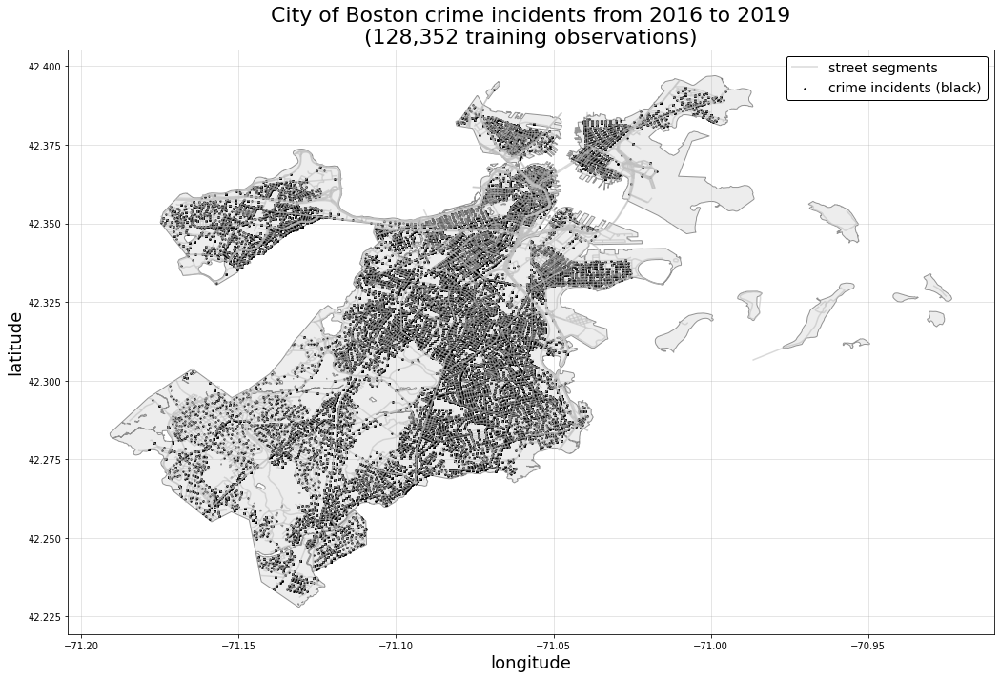

CPU times: user 3.07 s, sys: 658 ms, total: 3.73 s
Wall time: 2.53 s


In [14]:
%%time

savefig = True

fig, ax = plt.subplots(figsize=(16,10))
gdf_boston.plot(ax=ax, color='lightgray', edgecolor='k', alpha=0.4)
gdf_streets.plot(ax=ax, color='silver', edgecolor='k', alpha=.6, label='street segments')
plt.title(
    'City of Boston crime incidents from {} to {}\n'\
    '({:,} training observations)'\
    ''.format(
        np.min(X_train_labels['year'].values),
        np.max(X_train_labels['year'].values),
        len(X_train_labels)
    ),
    fontsize=22
)
plt.scatter(
    X_train_labels['lon'], X_train_labels['lat'],
    alpha=1, color='k', s=2, label='crime incidents (black)'
)

plt.xlabel('longitude', fontsize=18)
plt.ylabel('latitude', fontsize=18)
plt.grid(":", alpha=0.4)
plt.legend(edgecolor='k', framealpha=1, fontsize=14)
plt.tight_layout()
if savefig:
    plt.savefig(os.path.join(FIGURES_ROOT, 'crime-locs-all.png'))
plt.show();

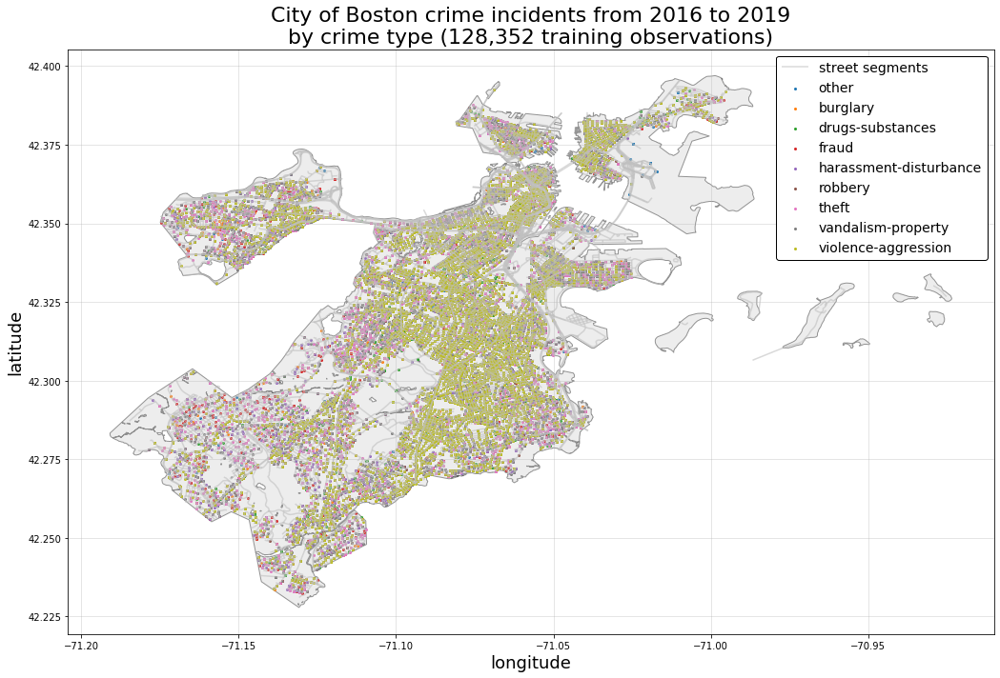

CPU times: user 3.41 s, sys: 641 ms, total: 4.05 s
Wall time: 2.78 s


In [15]:
%%time

savefig = True

fig, ax = plt.subplots(figsize=(16,10))
gdf_boston.plot(ax=ax, color='lightgray', edgecolor='k', alpha=0.4)
gdf_streets.plot(ax=ax, color='silver', edgecolor='k', alpha=.6, label='street segments')
plt.title(
    'City of Boston crime incidents from {} to {}\n'\
    'by crime type ({:,} training observations)'\
    ''.format(
        np.min(X_train_labels['year'].values),
        np.max(X_train_labels['year'].values),
        len(X_train_labels)
    ),
    fontsize=22
)

for cls, label in crime_type_dict.items():
    plt.scatter(
        X_train_labels[globals()['bool_{}'.format(cls)]]['lon'],
        X_train_labels[globals()['bool_{}'.format(cls)]]['lat'],
        alpha=1, s=4, label=label
    )

plt.xlabel('longitude', fontsize=18)
plt.ylabel('latitude', fontsize=18)
plt.grid(":", alpha=0.4)
plt.legend(edgecolor='k', framealpha=1, fontsize=14)
plt.tight_layout()
if savefig:
    plt.savefig(os.path.join(FIGURES_ROOT, 'crime-locs-all-by-type.png'))
plt.show();

In [16]:
# create neighborhood labels
hood_list = list(set(X_train_labels['Name']))
hood_crime_count = X_train_labels.groupby('Name').agg({'INCIDENT_NUMBER': 'count'}).rename(
    columns={'INCIDENT_NUMBER': 'crime-count'}
)
hood_crime_count_type = pd.pivot_table(
    X_train_labels, values='INCIDENT_NUMBER', index=['Name'], columns=['crime-type'],
    aggfunc='count'
)

print('The training data contains crimes for {} Boston neighborhoods\n'.format(len(hood_list)))
print('Those neighborhoods are:\n')
print(hood_list)
print('\n\nThe distribution of crimes by neighborhood are:\n')
print(hood_crime_count)
print('\n\nAnd by nieghborhood and crime type:\n')
print(hood_crime_count_type)

The training data contains crimes for 25 Boston neighborhoods

Those neighborhoods are:

['Charlestown', 'South End', 'West Roxbury', 'West End', 'Dorchester', 'South Boston', 'Bay Village', 'South Boston Waterfront', 'Downtown', 'Fenway', 'Jamaica Plain', 'Hyde Park', 'Mission Hill', 'North End', 'East Boston', 'Longwood', 'Allston', 'Chinatown', 'Beacon Hill', 'Roslindale', 'Mattapan', 'Leather District', 'Roxbury', 'Back Bay', 'Brighton']


The distribution of crimes by neighborhood are:

                         crime-count
Name                                
Allston                         3490
Back Bay                        6755
Bay Village                      366
Beacon Hill                      854
Brighton                        4195
Charlestown                     2323
Chinatown                       1327
Dorchester                     31559
Downtown                        9927
East Boston                     5197
Fenway                          4025
Hyde Park             

In [17]:
list(hood_crime_count.index)

['Allston',
 'Back Bay',
 'Bay Village',
 'Beacon Hill',
 'Brighton',
 'Charlestown',
 'Chinatown',
 'Dorchester',
 'Downtown',
 'East Boston',
 'Fenway',
 'Hyde Park',
 'Jamaica Plain',
 'Leather District',
 'Longwood',
 'Mattapan',
 'Mission Hill',
 'North End',
 'Roslindale',
 'Roxbury',
 'South Boston',
 'South Boston Waterfront',
 'South End',
 'West End',
 'West Roxbury']

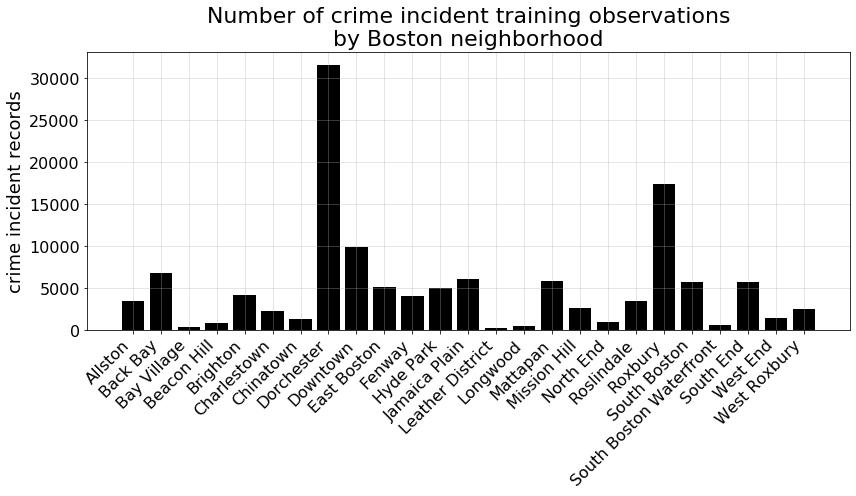

In [18]:
savefig = True

fig, ax = plt.subplots(figsize=(12, 7))
plt.bar(hood_crime_count.index, hood_crime_count['crime-count'], color='k')
plt.title(
    'Number of crime incident training observations\nby Boston neighborhood',
    fontsize=22
)

ax.tick_params(labelsize=16)
ax.set_ylabel("crime incident records", fontsize=18)
ax.set_xticklabels(hood_crime_count.index, rotation=45, horizontalalignment='right')
ax.grid(':', alpha=0.4)
if savefig:
    plt.savefig(os.path.join(FIGURES_ROOT, 'crime-by-neighborhood-barplot.png'))
plt.tight_layout()
plt.show();

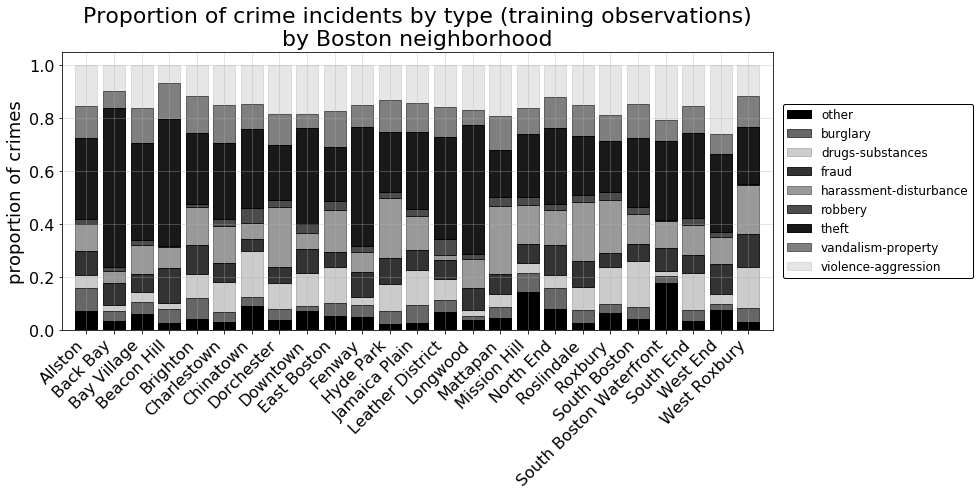

In [19]:
savefig = True

alphas = [1, 1-.4, 1-.8, 1-.2, 1-.6, 1-.3, 1-.1, 1-.5, 1-.9]

fig, ax = plt.subplots(figsize=(14, 7))
plt.title(
    'Proportion of crime incidents by type (training observations)\nby Boston neighborhood',
    fontsize=22
)

bottom = np.zeros(len(hood_crime_count_type.index))
for (i, col), alpha in zip(enumerate(hood_crime_count_type.columns), alphas): 
    plt.bar(
        hood_crime_count_type.index,
        hood_crime_count_type[col]/hood_crime_count_type.sum(axis=1),
        bottom=bottom,
        color='k',
        edgecolor='k',
        alpha=alpha,
        label=crime_type_dict[col]
    )
    bottom += hood_crime_count_type[col].values/hood_crime_count_type.sum(axis=1)

ax.tick_params(labelsize=16)
ax.set_ylabel("proportion of crimes", fontsize=18)
ax.set_xticklabels(hood_crime_count.index, rotation=45, horizontalalignment='right')
ax.margins(x=0.02)
ax.grid(':', alpha=0.4)
ax.legend(
        fontsize=12,
        loc="center right",
        bbox_to_anchor=(1.29, 0.5),
        framealpha=1,
        edgecolor='k'
    )
if savefig:
    plt.savefig(os.path.join(FIGURES_ROOT, 'crime-by-neighborhood-and-type-barplot.png'))
plt.tight_layout()
plt.show();

In [20]:
# create dataframe containing x and y limits for each neighborhood to plot detailed maps
hood_limits_df = pd.DataFrame(gdf_hoods['geometry'].bounds.set_index(gdf_hoods['Name']))

hood_limits_df.head()

,minx,miny,maxx,maxy
Name,,,,
Roslindale,-71.147786,42.267616,-71.099615,42.298389
Jamaica Plain,-71.140171,42.286361,-71.095109,42.330076
Mission Hill,-71.114039,42.326099,-71.090434,42.337700
Longwood,-71.111560,42.334211,-71.097216,42.343882
Bay Village,-71.072811,42.347751,-71.066456,42.350955


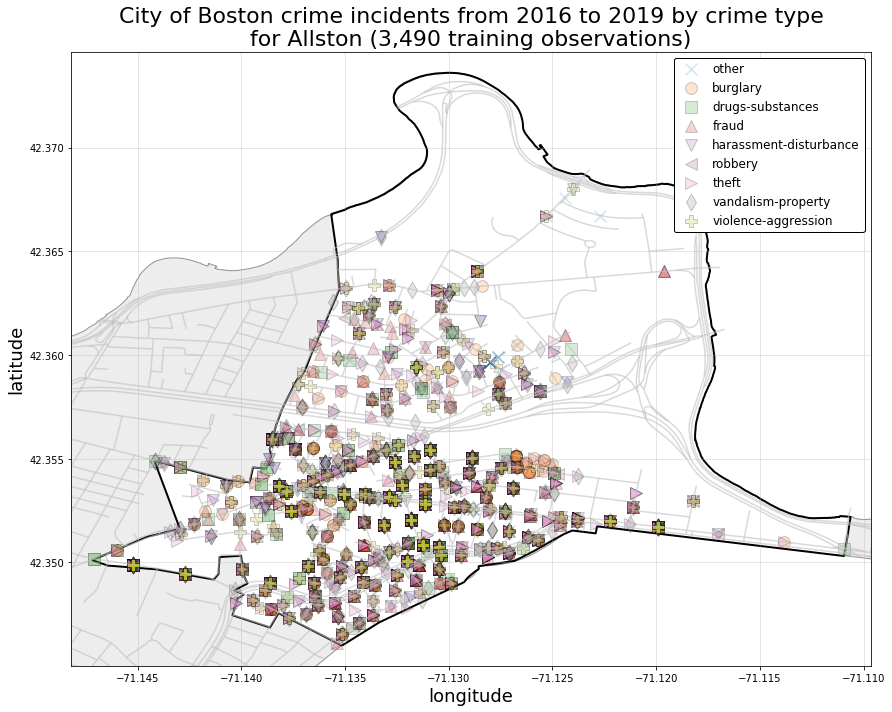

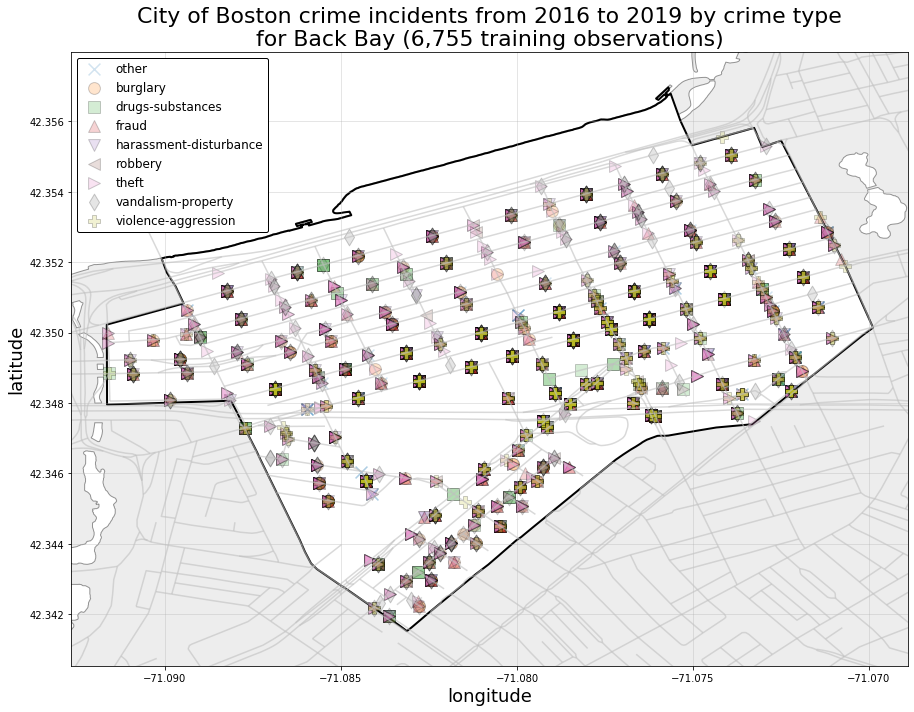

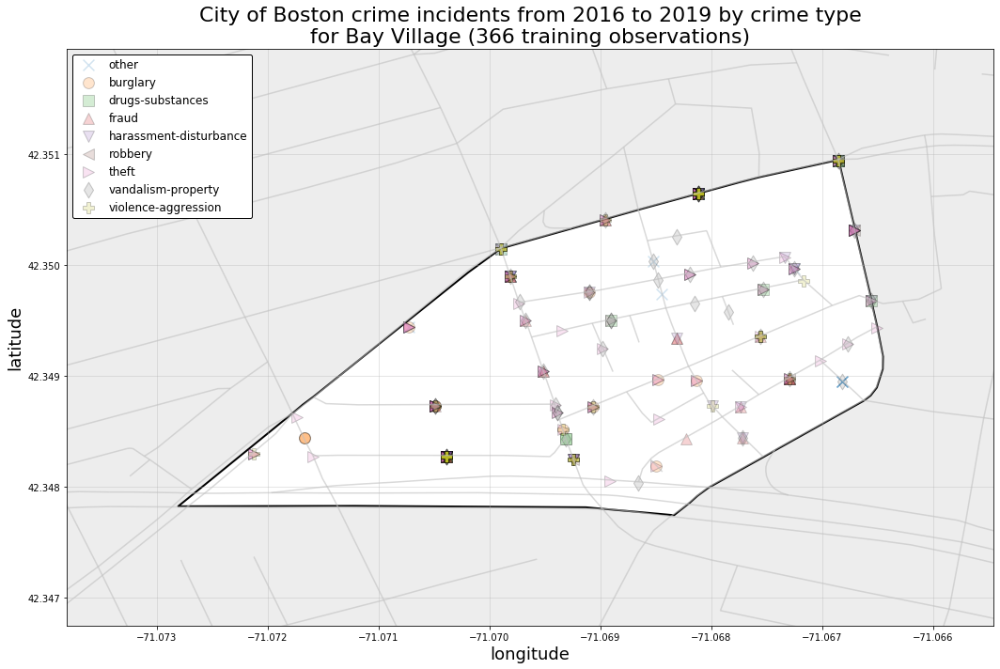

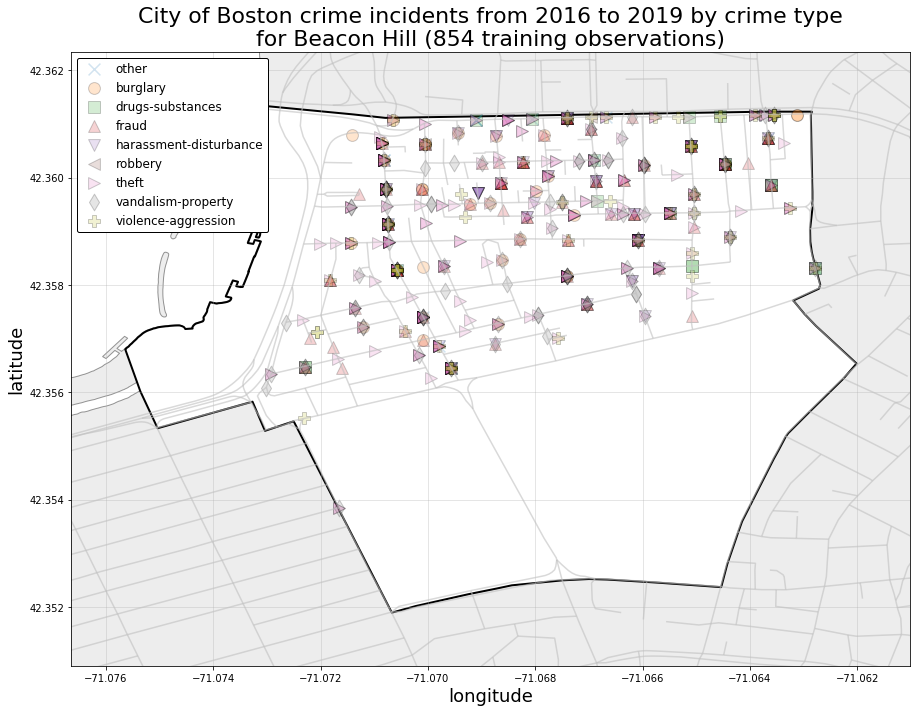

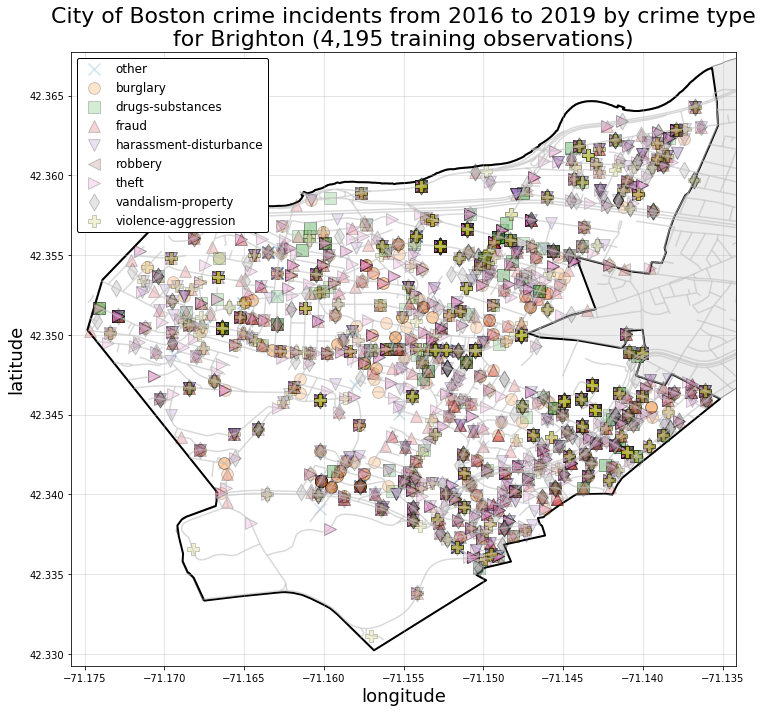

...

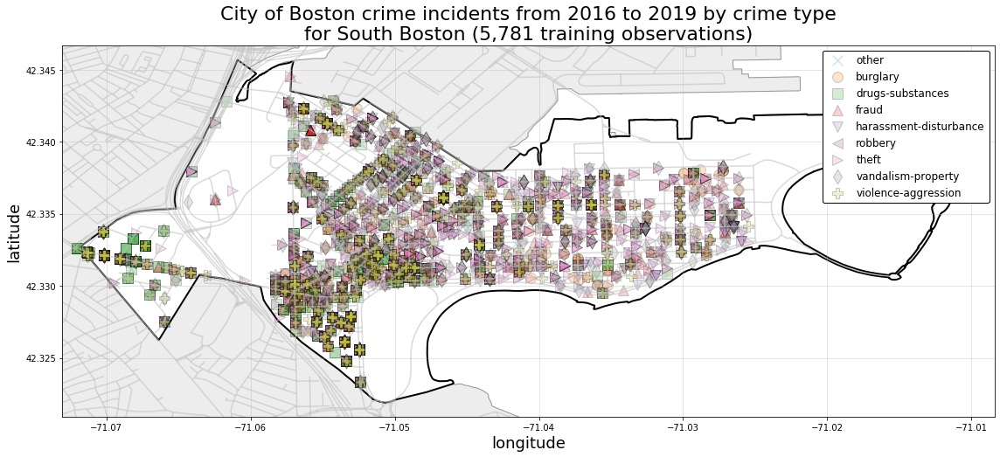

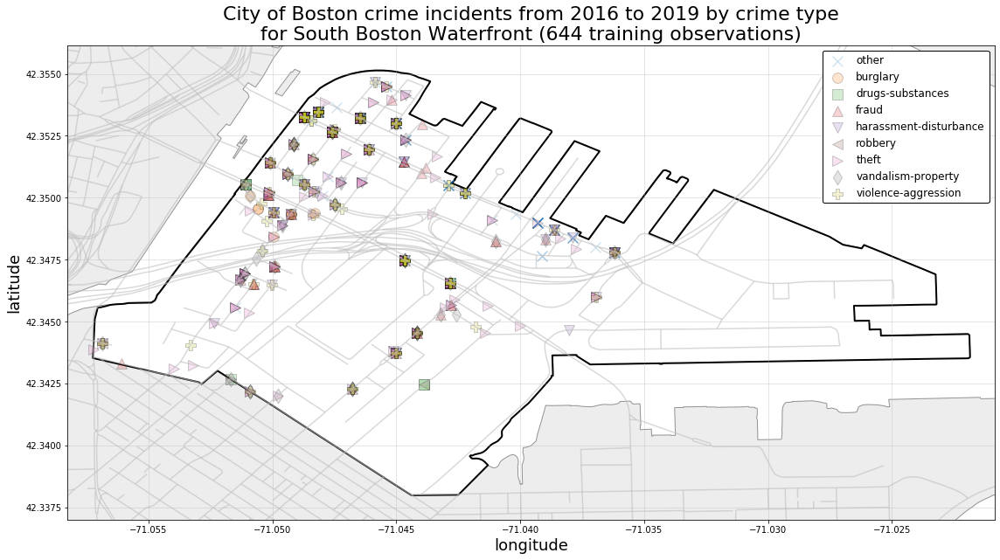

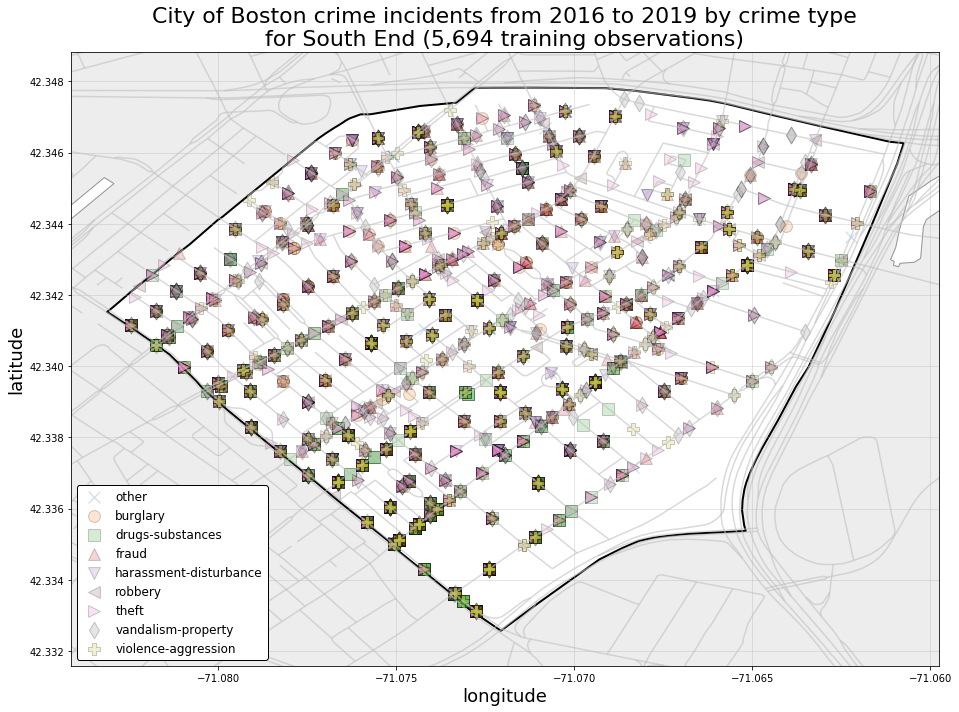

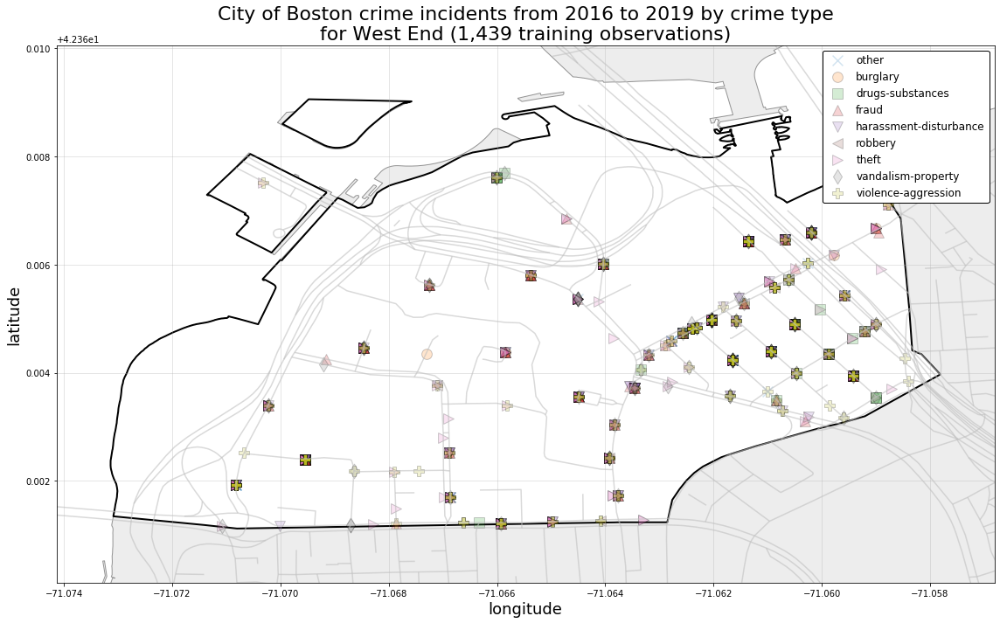

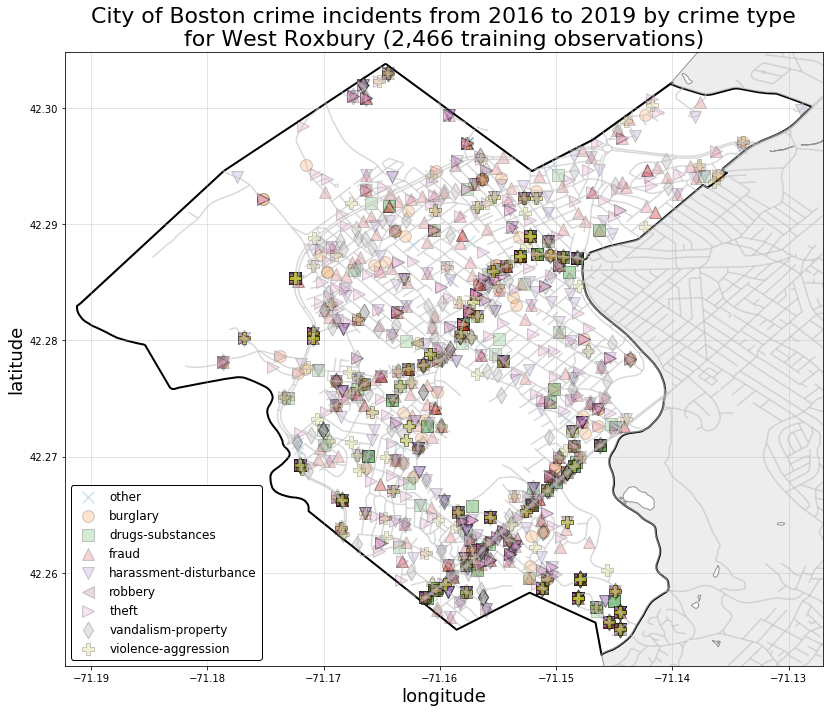

CPU times: user 1min 2s, sys: 15 s, total: 1min 17s
Wall time: 45.8 s


In [21]:
%%time

savefig = True

pad = .001
marker_list = ['x', 'o', 's', '^', 'v', '<', '>', 'd', 'P']

for hood in hood_crime_count.index:
    fig, ax = plt.subplots(figsize=(16,10))

    gdf_boston.plot(ax=ax, color='lightgray', edgecolor='k', alpha=0.4)
    gdf_hoods.loc[gdf_hoods['Name']==hood].plot(ax=ax, color='white', edgecolor='k', linewidth=2, alpha=1)
    gdf_streets.plot(ax=ax, color='silver', edgecolor='k', alpha=.6)

    plt.title(
        'City of Boston crime incidents from {} to {} by crime type\n'\
        'for {} ({:,} training observations)'\
        ''.format(
            np.min(X_train_labels['year'].values),
            np.max(X_train_labels['year'].values),
            hood,
            hood_crime_count.loc[hood]['crime-count']
        ),
        fontsize=22
    )

    for (cls, label), marker in zip(crime_type_dict.items(), marker_list):
        plt.scatter(
            X_train_labels[globals()['bool_{}'.format(cls)]].loc[X_train_labels['Name']==hood]['lon'],
            X_train_labels[globals()['bool_{}'.format(cls)]].loc[X_train_labels['Name']==hood]['lat'],
            alpha=.2, s=140, edgecolor='k', marker=marker, label=label
        )

    plt.xlabel('longitude', fontsize=18)
    plt.ylabel('latitude', fontsize=18)
    plt.xlim(
        left=hood_limits_df.loc[hood]['minx']-pad,
        right=hood_limits_df.loc[hood]['maxx']+pad
    )
    plt.ylim(
        bottom=hood_limits_df.loc[hood]['miny']-pad,
        top=hood_limits_df.loc[hood]['maxy']+pad
    )
    plt.grid(":", alpha=0.4)
    plt.legend(edgecolor='k', framealpha=1, fontsize=12)
    plt.tight_layout()
    if savefig:
        plt.savefig(os.path.join(FIGURES_ROOT, 'crime-locs-all-by-type-{}.png'.format(hood.replace(' ', ''))))
    plt.show();

## Use T-STATISTIC to measure one-vs-rest relationships between each predictor and class

In [31]:
# define a vectorized function for calculating t-statistics to further investigate
# potential biases

def calc_t_stats(X_data, y_bool, sort=False) -> pd.Series:
    """
    Calculates t_stats for all predictors in an X_data using 
    binary (1, 0) classifiers in a corresponding y_data
    
    X_data: pd.DataFrame containing predictors of interest and
            observed values for those predictors
    y_data: np.array containing boolean classifiers for
            variable of interest corresponding to all observed
            values X in X_data
    sort: boolean, default=False, determines whether the resulting
          t_stats series is sorted from largest to smallest values
    returns: pd.Series wherein the index are the predictor names
             and the values are the corresponding t_stats
    """
    # identify rows in dataset representing each response class 1 and 0 
    bool_1, bool_0 = y_bool == True, y_bool == False

    # subset X_data based on corresponding response classes
    X_1, X_0 = X_data[bool_1], X_data[bool_0]
    
    # calculate means for each subset of X values
    X_1_mean, X_0_mean = X_1.mean(axis=0), X_0.mean(axis=0)

    # calculate variances for each subset of X values
    X_1_var = X_1.var(axis=0)
    X_0_var = X_0.var(axis=0)

    # count number of observations in each subset of X values
    X_1_n = len(X_1)
    X_0_n = len(X_0)

    # calculate nominator and denominator for t_stat
    nom = (X_1_mean - X_0_mean).abs()
    denom = ((X_1_var/X_1_n) + (X_0_var/X_0_n))**.5
    
    # calculate and return t_stat, sorting values if specified
    if sort:
        return (nom / denom).sort_values(ascending=False)
    
    else:
        return (nom / denom)

In [137]:
def plot_top_tstat_predictors(X_train, class_bool_index, tstat_series,
                              predictor_type_dict, class_name,
                              savepath=None, n_predictors=6, subplots=(3,2), 
                              fig_height=15, suptitle_spacing=0.91,
                              print_summary=True):
    """
    Plots top predictors based on t-statistic for one-vs-rest class and prints
    summary stats
    """

    # identify which rows belong to the target class
    # identify rows in dataset representing each response class 1 and 0 
    bool_1, bool_0 = class_bool_index == True, class_bool_index == False

    # subset X_data based on corresponding response classes
    X_1, X_0 = X_train[bool_1], X_train[bool_0]
    
    # calculate means for each subset of X values
    X_1_mean, X_0_mean = X_1.mean(axis=0), X_0.mean(axis=0)

    # subset top 6 predictors by t-stat for plotting
    tstats_top = tstat_series[:n_predictors].index

    # count number of observations in each subset of X values
    X_1_n = len(X_1)
    X_0_n = len(X_0)

    # plot histograms of the top 4 predictors from the training data
    fig, axes = plt.subplots(*subplots, sharex=False, sharey=False, figsize=(12,fig_height))

    plt.suptitle(
        'Top {} predictors most strongly related based on t-statistic\n'\
        'to "{}" crime incidents in the training set'.format(
            n_predictors,
            class_name
        ),
        fontsize=22
    )

    for (i, ax), var in zip(enumerate(axes.flatten()), tstat_series.index):
        if var in predictor_type_dict['binary']:
            ax.bar(
                X_1[var].value_counts().index,
                X_1[var].value_counts().values / X_1_n * 100,
                color='tab:blue', edgecolor=None, alpha=0.6,
                label='{}'.format(class_name)
            )
            ax.bar(
                X_0[var].value_counts().index,
                X_0[var].value_counts().values / X_0_n * 100,
                color='k', alpha=0.2, label='all other classes'
            )
            ax.set_xticks([0,1])
            ax.set_xticks([0,1])

        if var in predictor_type_dict['non-binary']:
            ax.hist(
                X_1[var], bins=15,
                density=True,
                color='tab:blue', edgecolor=None, alpha=0.6,
                label='{}'.format(class_name)
            )
            ax.hist(
                X_0[var], bins=25,
                density=True,
                color='k', alpha=0.2, label='all other classes'
            )


        ax.axvline(
            X_1[var].mean(),
            linestyle='-', color='k', linewidth=2.5, label='{}\nmean'.format(class_name)
        )
        ax.axvline(
            X_0[var].mean(),
            color='k', linestyle='--', linewidth=2.5, label='all other classes\nmean'
        )

        ax.set_xlabel('{0}'.format(var.replace('_', ' ')), fontsize=14)
        ax.set_ylabel('proportion observed', fontsize=14)
        ax.grid(":", alpha=0.4)
        ax.set_title(
            '{0}\n($t={1:.2f}$)'.format(var, tstat_series.loc[var]),
            fontsize=18
        )


    axes[0,1].legend(fontsize=12, edgecolor='k', framealpha=1, markerscale=1.5)
    plt.tight_layout(rect=[0, 0.03, 1, suptitle_spacing])
    if savepath:
        plt.savefig(savepath)
    plt.show()
    
    
    if print_summary:
        X_1_desc, X_0_desc = X_1[tstats_top].describe(), X_0[tstats_top].describe()  

        # report on descriptive stats for each plotted predictor
        print(
            'The summary statistics for each of the above plotted predictors are:\n\n'
            '\t\t\t\tmin\t25%\tmedian\t75%\tmax\tmean\tstd'
        )
        for var in tstats_top:
            print(
                '{}\n'\
                '   {}\t{:.0f}\t{:.0f}\t{:.0f}\t{:.0f}\t{:.0f}\t{:.1f}\t{:.2f}\n'\
                '   all other classes     \t{:.0f}\t{:.0f}\t{:.0f}\t{:.0f}\t{:.0f}\t{:.1f}\t{:.2f}\n'\
                ''.format(
                    var,
                    (class_name+'                  ')[:22],
                    X_1_desc[var].loc['min'],
                    X_1_desc[var].loc['25%'],
                    X_1_desc[var].loc['50%'],
                    X_1_desc[var].loc['75%'],
                    X_1_desc[var].loc['max'],
                    X_1_desc[var].loc['mean'],
                    X_1_desc[var].loc['std'],
                    X_0_desc[var].loc['min'],
                    X_0_desc[var].loc['25%'],
                    X_0_desc[var].loc['50%'],
                    X_0_desc[var].loc['75%'],
                    X_0_desc[var].loc['max'],
                    X_0_desc[var].loc['mean'],
                    X_0_desc[var].loc['std'],
                )
            )
            print('\n')

In [42]:
##########################################################
#CALCULATE T-STATISTICS FOR ALL PREDICTORS AND ALL CLASSES
##########################################################

tstats_dict = {
    i: calc_t_stats(X_train, globals()['bool_{}'.format(i)], sort=True)
    for i in range(9)
}

print('The predictors with the largest t-statistics related to each crime-type class are:\n')
for i in range(9):
    print(
        'class {}: {}\n\n{}\n\n'.format(i, crime_type_dict[i], tstats_dict[i][:8])
    )

The predictors with the largest t-statistics related to each crime-type class are:

class 0: other

owner-occupied-ratio     22.273876
lat                      18.267198
poverty-rate             17.126022
median-age               17.011709
enrolled-college-perc    16.391080
streetlights-night        9.755394
median-income             9.065848
residential-gini-coef     8.968192
dtype: float64


class 1: burglary

commercial-mix-ratio            15.763925
night                           14.720921
lon                             13.690131
less-than-high-school-perc      10.112486
college-near                     9.622414
streetlights-night               9.404400
residential-median-value         6.623549
bachelor-degree-or-more-perc     5.012637
dtype: float64


class 2: drugs-substances

night                         34.348157
streetlights-night            27.675943
industrial-mix-ratio          26.967262
Sunday                        25.628384
less-than-high-school-perc    23.495035
enro

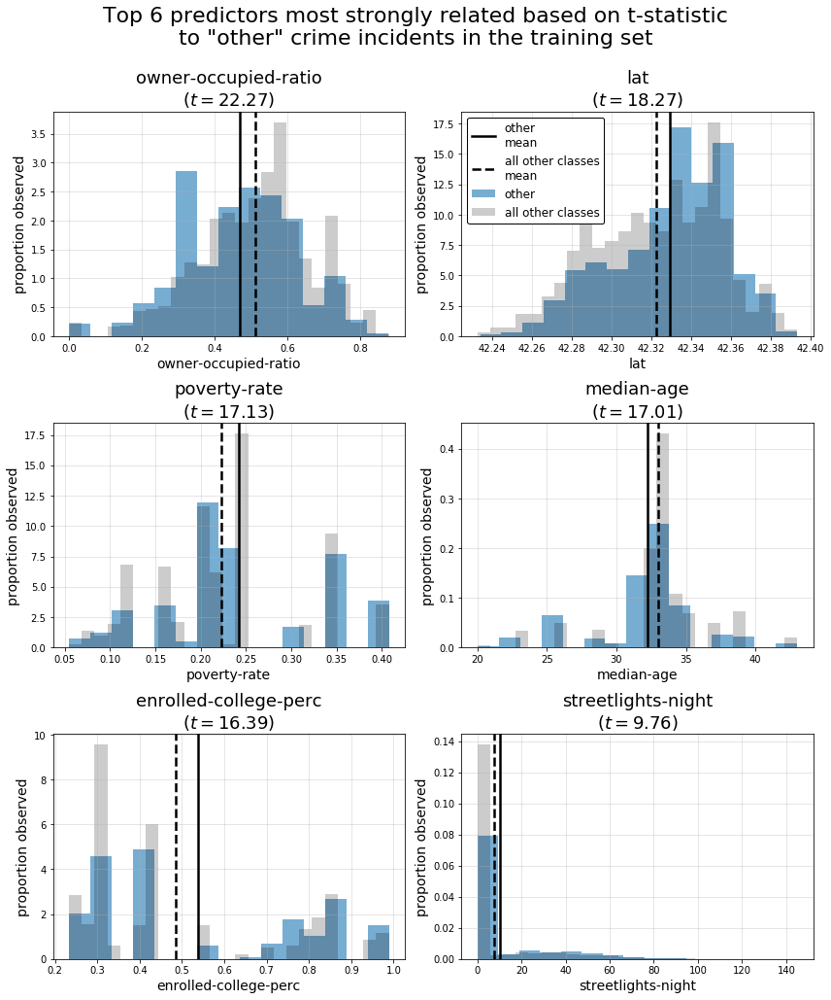

The summary statistics for each of the above plotted predictors are:

				min	25%	median	75%	max	mean	std
owner-occupied-ratio
   other                 	0	0	0	1	1	0.5	0.15
   all other classes     	0	0	1	1	1	0.5	0.15



lat
   other                 	42	42	42	42	42	42.3	0.03
   all other classes     	42	42	42	42	42	42.3	0.03



poverty-rate
   other                 	0	0	0	0	0	0.2	0.09
   all other classes     	0	0	0	0	0	0.2	0.08



median-age
   other                 	20	32	33	33	43	32.2	3.50
   all other classes     	20	32	33	34	43	33.0	3.51



enrolled-college-perc
   other                 	0	0	0	1	1	0.5	0.25
   all other classes     	0	0	0	1	1	0.5	0.24



streetlights-night
   other                 	0	0	0	8	142	10.2	20.01
   all other classes     	0	0	0	0	145	7.7	17.76





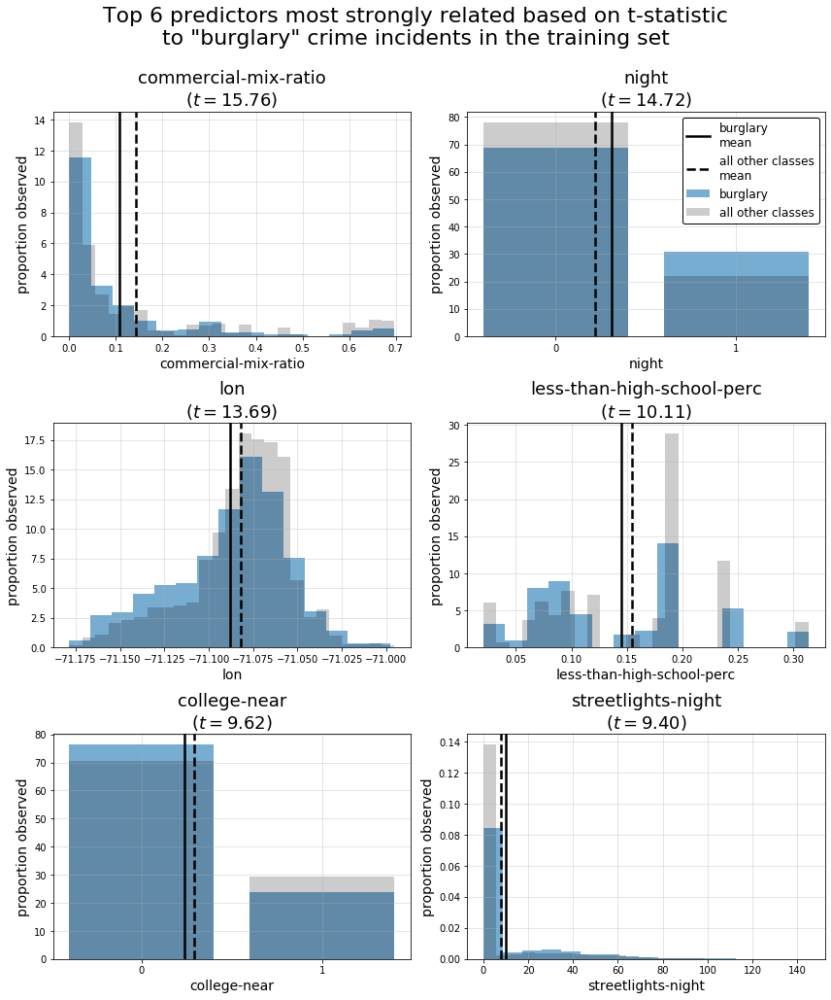

The summary statistics for each of the above plotted predictors are:

				min	25%	median	75%	max	mean	std
commercial-mix-ratio
   burglary              	0	0	0	0	1	0.1	0.16
   all other classes     	0	0	0	0	1	0.1	0.20



night
   burglary              	0	0	0	1	1	0.3	0.46
   all other classes     	0	0	0	0	1	0.2	0.41



lon
   burglary              	-71	-71	-71	-71	-71	-71.1	0.03
   all other classes     	-71	-71	-71	-71	-71	-71.1	0.03



less-than-high-school-perc
   burglary              	0	0	0	0	0	0.1	0.07
   all other classes     	0	0	0	0	0	0.2	0.07



college-near
   burglary              	0	0	0	0	1	0.2	0.43
   all other classes     	0	0	0	1	1	0.3	0.46



streetlights-night
   burglary              	0	0	0	13	130	10.2	19.76
   all other classes     	0	0	0	0	145	7.7	17.79





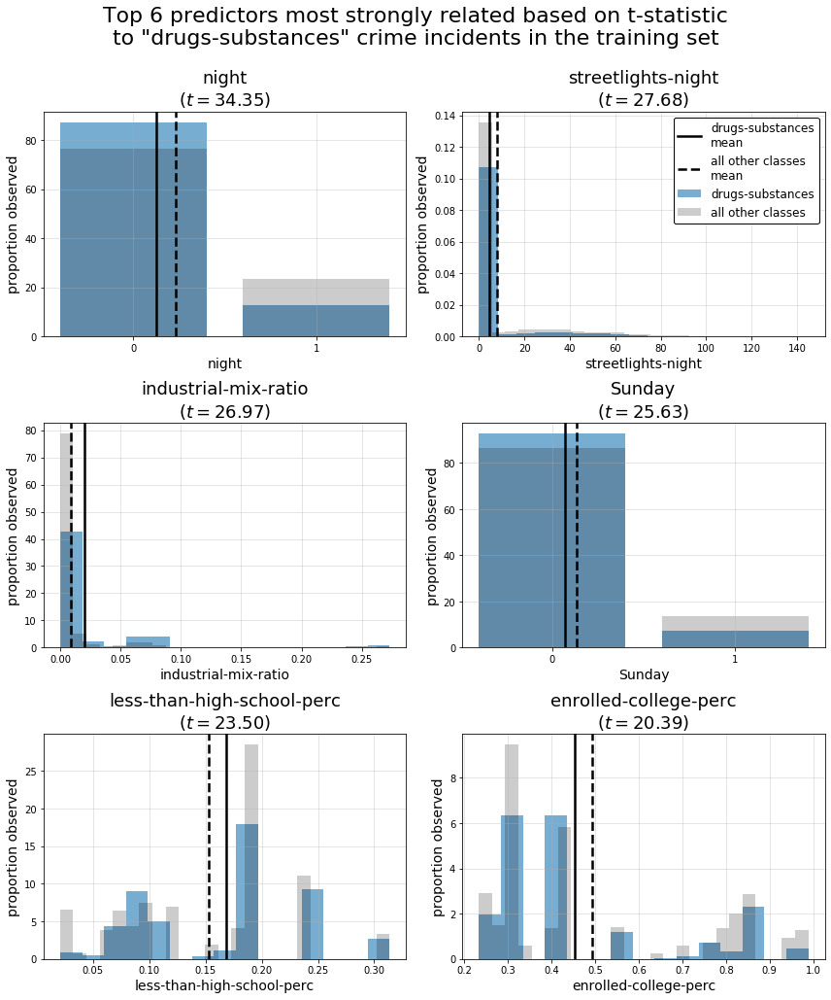

The summary statistics for each of the above plotted predictors are:

				min	25%	median	75%	max	mean	std
night
   drugs-substances      	0	0	0	0	1	0.1	0.33
   all other classes     	0	0	0	0	1	0.2	0.42



streetlights-night
   drugs-substances      	0	0	0	0	124	4.5	13.88
   all other classes     	0	0	0	0	145	8.2	18.25



industrial-mix-ratio
   drugs-substances      	0	0	0	0	0	0.0	0.05
   all other classes     	0	0	0	0	0	0.0	0.03



Sunday
   drugs-substances      	0	0	0	0	1	0.1	0.26
   all other classes     	0	0	0	0	1	0.1	0.34



less-than-high-school-perc
   drugs-substances      	0	0	0	0	0	0.2	0.07
   all other classes     	0	0	0	0	0	0.2	0.07



enrolled-college-perc
   drugs-substances      	0	0	0	1	1	0.5	0.21
   all other classes     	0	0	0	1	1	0.5	0.24





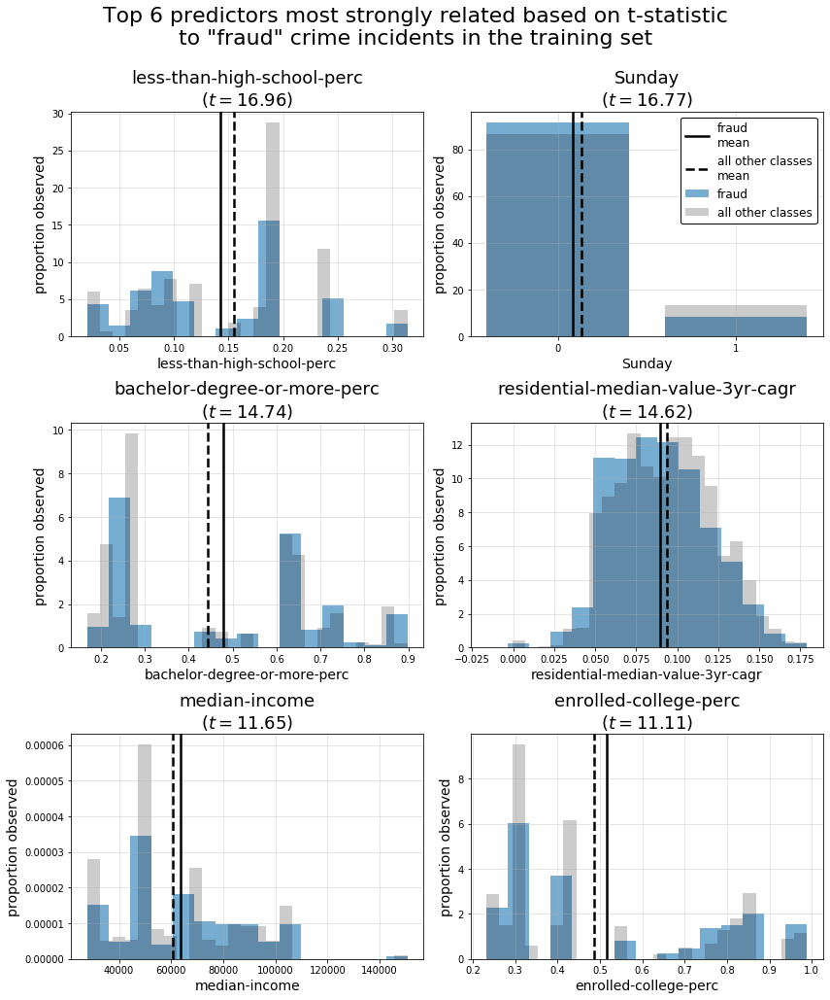

The summary statistics for each of the above plotted predictors are:

				min	25%	median	75%	max	mean	std
less-than-high-school-perc
   fraud                 	0	0	0	0	0	0.1	0.07
   all other classes     	0	0	0	0	0	0.2	0.07



Sunday
   fraud                 	0	0	0	0	1	0.1	0.28
   all other classes     	0	0	0	0	1	0.1	0.34



bachelor-degree-or-more-perc
   fraud                 	0	0	1	1	1	0.5	0.23
   all other classes     	0	0	0	1	1	0.4	0.22



residential-median-value-3yr-cagr
   fraud                 	-0	0	0	0	0	0.1	0.03
   all other classes     	-0	0	0	0	0	0.1	0.03



median-income
   fraud                 	27721	49662	62041	84446	150678	63709.1	23247.18
   all other classes     	27721	48197	49662	80804	150678	60830.9	23495.71



enrolled-college-perc
   fraud                 	0	0	0	1	1	0.5	0.25
   all other classes     	0	0	0	1	1	0.5	0.24





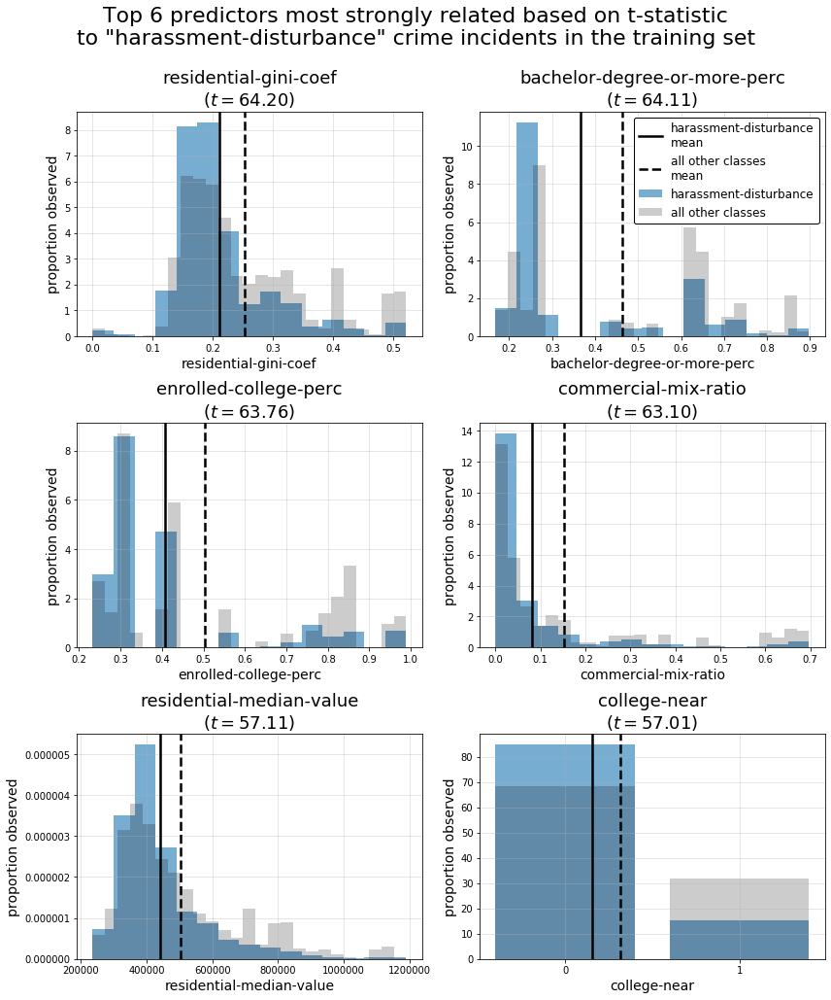

The summary statistics for each of the above plotted predictors are:

				min	25%	median	75%	max	mean	std
residential-gini-coef
   harassment-disturbance	0	0	0	0	1	0.2	0.08
   all other classes     	0	0	0	0	1	0.3	0.11



bachelor-degree-or-more-perc
   harassment-disturbance	0	0	0	1	1	0.4	0.19
   all other classes     	0	0	0	1	1	0.5	0.23



enrolled-college-perc
   harassment-disturbance	0	0	0	0	1	0.4	0.19
   all other classes     	0	0	0	1	1	0.5	0.24



commercial-mix-ratio
   harassment-disturbance	0	0	0	0	1	0.1	0.13
   all other classes     	0	0	0	0	1	0.2	0.20



residential-median-value
   harassment-disturbance	236800	357350	408250	478700	1189150	441864.0	132572.26
   all other classes     	236800	367850	441900	594750	1189150	503709.5	187338.65



college-near
   harassment-disturbance	0	0	0	0	1	0.2	0.36
   all other classes     	0	0	0	1	1	0.3	0.47





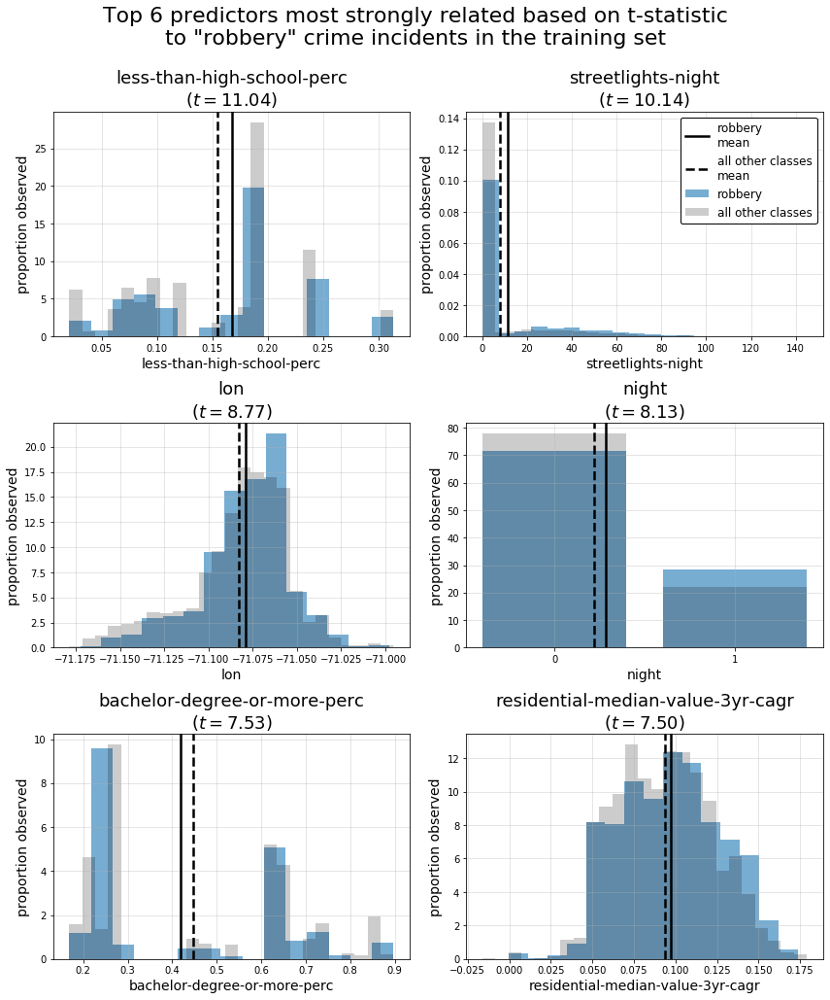

The summary statistics for each of the above plotted predictors are:

				min	25%	median	75%	max	mean	std
less-than-high-school-perc
   robbery               	0	0	0	0	0	0.2	0.07
   all other classes     	0	0	0	0	0	0.2	0.07



streetlights-night
   robbery               	0	0	0	17	109	11.4	21.27
   all other classes     	0	0	0	0	145	7.7	17.77



lon
   robbery               	-71	-71	-71	-71	-71	-71.1	0.02
   all other classes     	-71	-71	-71	-71	-71	-71.1	0.03



night
   robbery               	0	0	0	1	1	0.3	0.45
   all other classes     	0	0	0	0	1	0.2	0.41



bachelor-degree-or-more-perc
   robbery               	0	0	0	1	1	0.4	0.21
   all other classes     	0	0	0	1	1	0.4	0.22



residential-median-value-3yr-cagr
   robbery               	-0	0	0	0	0	0.1	0.03
   all other classes     	-0	0	0	0	0	0.1	0.03





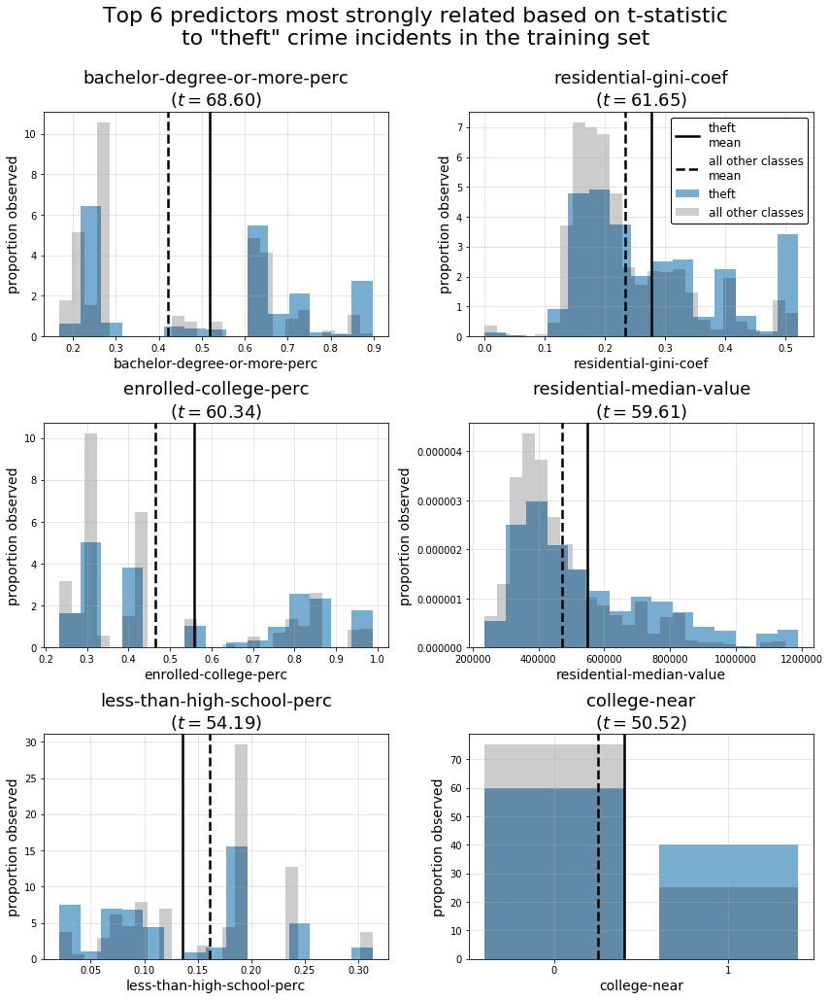

The summary statistics for each of the above plotted predictors are:

				min	25%	median	75%	max	mean	std
bachelor-degree-or-more-perc
   theft                 	0	0	1	1	1	0.5	0.23
   all other classes     	0	0	0	1	1	0.4	0.21



residential-gini-coef
   theft                 	0	0	0	0	1	0.3	0.12
   all other classes     	0	0	0	0	1	0.2	0.10



enrolled-college-perc
   theft                 	0	0	0	1	1	0.6	0.25
   all other classes     	0	0	0	1	1	0.5	0.23



residential-median-value
   theft                 	236800	380550	480000	695500	1189150	549007.2	214404.01
   all other classes     	236800	362100	422500	534900	1189150	473328.9	162416.44



less-than-high-school-perc
   theft                 	0	0	0	0	0	0.1	0.08
   all other classes     	0	0	0	0	0	0.2	0.07



college-near
   theft                 	0	0	0	1	1	0.4	0.49
   all other classes     	0	0	0	0	1	0.2	0.43





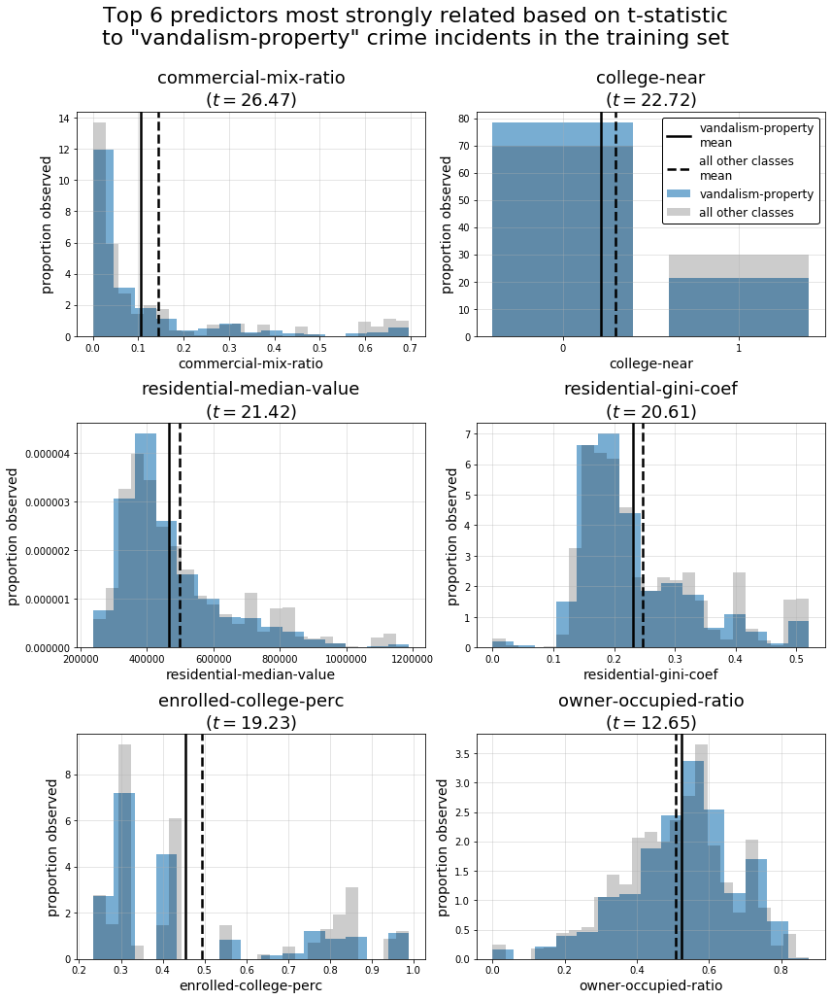

The summary statistics for each of the above plotted predictors are:

				min	25%	median	75%	max	mean	std
commercial-mix-ratio
   vandalism-property    	0	0	0	0	1	0.1	0.16
   all other classes     	0	0	0	0	1	0.1	0.20



college-near
   vandalism-property    	0	0	0	0	1	0.2	0.41
   all other classes     	0	0	0	1	1	0.3	0.46



residential-median-value
   vandalism-property    	236800	364700	421500	526700	1189150	466714.2	152451.35
   all other classes     	236800	366700	435500	576700	1189150	496930.6	183910.15



residential-gini-coef
   vandalism-property    	0	0	0	0	1	0.2	0.09
   all other classes     	0	0	0	0	1	0.2	0.11



enrolled-college-perc
   vandalism-property    	0	0	0	1	1	0.5	0.22
   all other classes     	0	0	0	1	1	0.5	0.24



owner-occupied-ratio
   vandalism-property    	0	0	1	1	1	0.5	0.15
   all other classes     	0	0	1	1	1	0.5	0.15





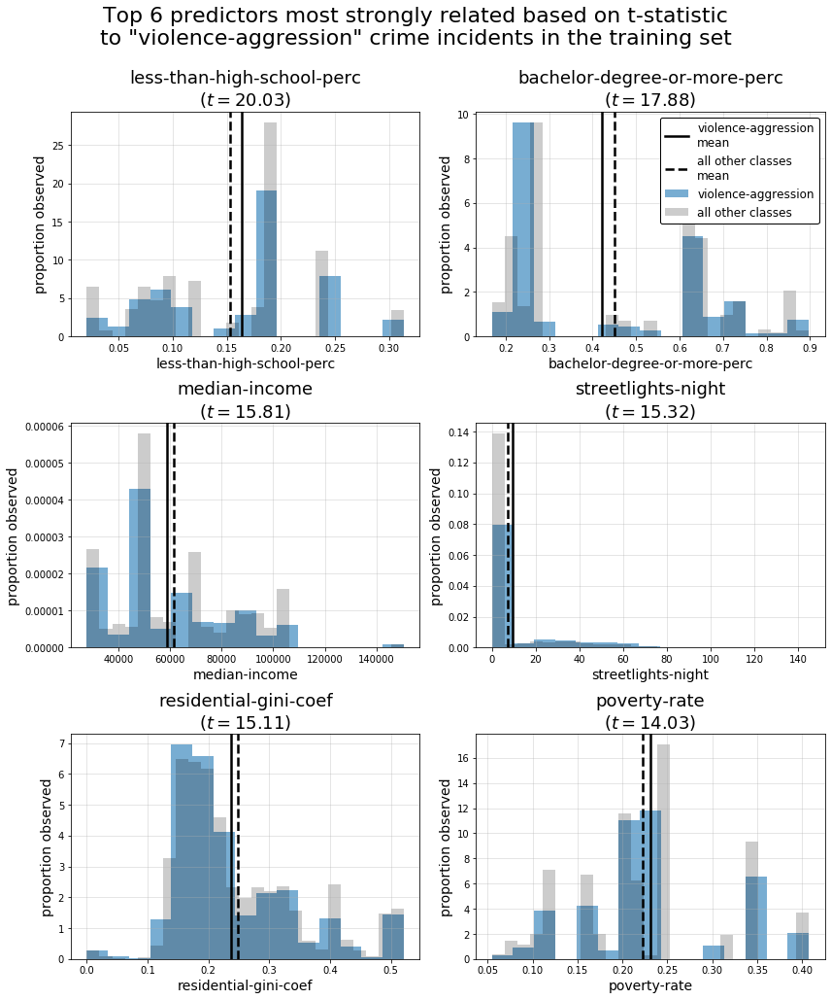

The summary statistics for each of the above plotted predictors are:

				min	25%	median	75%	max	mean	std
less-than-high-school-perc
   violence-aggression   	0	0	0	0	0	0.2	0.07
   all other classes     	0	0	0	0	0	0.2	0.07



bachelor-degree-or-more-perc
   violence-aggression   	0	0	0	1	1	0.4	0.22
   all other classes     	0	0	0	1	1	0.5	0.22



median-income
   violence-aggression   	27721	48197	49662	70810	150678	58758.6	22990.56
   all other classes     	27721	48197	49662	80804	150678	61499.5	23560.74



streetlights-night
   violence-aggression   	0	0	0	2	144	9.6	19.46
   all other classes     	0	0	0	0	145	7.4	17.53



residential-gini-coef
   violence-aggression   	0	0	0	0	1	0.2	0.10
   all other classes     	0	0	0	0	1	0.2	0.10



poverty-rate
   violence-aggression   	0	0	0	0	0	0.2	0.08
   all other classes     	0	0	0	0	0	0.2	0.08





In [138]:
# generate pridictor type dict for use in t-stat plotting function
predictor_type_dict = {
    'binary': predictors_binary,
    'non-binary': predictors_discrete + predictors_continuous,
}

# generat top predictor plots for all classes
for crime_type in crime_type_dict.keys():    
    plot_top_tstat_predictors(
        X_train,
        globals()['bool_{}'.format(crime_type)],
        tstats_dict[crime_type],
        predictor_type_dict,
        crime_type_dict[crime_type],
        savepath=os.path.join(FIGURES_ROOT, 'tstat-top-pred-{}'.format(crime_type_dict[crime_type])),
        n_predictors=6, subplots=(3,2), 
        fig_height=15, suptitle_spacing=0.93
    )

## Perform PCA decomposition and investigate explained variance

In [43]:
# perform PCA transformation on dataset
PCATransformer = PCA(random_state=10).fit(X_train_scaled)
X_train_pca = PCATransformer.transform(X_train_scaled)

print(
    'The shape of the full PCA decomposition on X_train is:\n\n'\
    '\ttrain\t{0}\n'.format(
        X_train_pca.shape,
    )
)

The shape of the full PCA decomposition on X_train is:

	train	(128352, 43)



In [44]:
explained_variance = PCATransformer.explained_variance_ratio_
num_components = np.arange(1, len(explained_variance)+1)
cumulative_variance = np.cumsum(explained_variance)

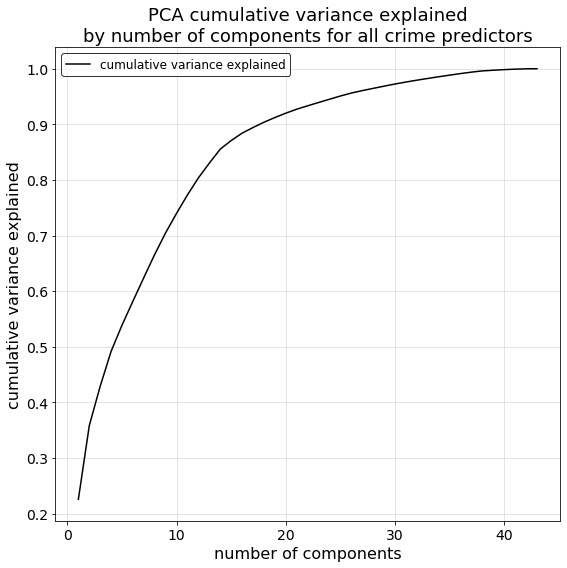

In [45]:
# plot cumulative variance as a factor of components
savefig = True

fig, ax = plt.subplots(figsize=(8,8))

plt.title(
    "PCA cumulative variance explained\nby number of components for all crime predictors",
    fontsize=18
)

plt.plot(
    num_components,
    cumulative_variance,
    'k-',
    label='cumulative variance explained'
)

plt.xlabel("number of components", fontsize=16)
plt.xticks(fontsize=14)
plt.ylabel("cumulative variance explained", fontsize=16)
plt.yticks(fontsize=14)
plt.grid(':', alpha=0.4)
plt.legend(edgecolor='k', fontsize=12)
plt.tight_layout()
if savefig:
    plt.savefig(os.path.join(FIGURES_ROOT, 'pca-cum-variance-explained.png'))
plt.show();

## Inspect multi-collinearity of predictors

In [23]:
def sort_pairwise_correlation(X_train):
    """
    Calculates a correlation matrix of all input predictors and observations,
    via the X_train dataframe, then returns a sorted dataframe of all
    pairwise correlation values (duplicates and same-value pairings removed).
    
    The returned sorted correlation summary dataframe is sorted in descending
    order, from highest to lowest correlation pairings.
    """
    # calculate correlation among all predictors
    correlation_matrix_df = X_train.corr()
    correlation_abs_matrix_df = X_train.corr().abs()

    # identify variables most heavily correlated in descending order
    # and remove pairwise groupings of the same predictors
    corr_unstack = correlation_abs_matrix_df.unstack()
    corr_sorted = corr_unstack.sort_values(ascending=False)
    corr_sorted = corr_sorted[corr_sorted < 1][::2]
    
    return corr_sorted


In [26]:
#############################################
## Calculate and report on pairwise correlations
#############################################

# generate sorted correlation dataframe
corr_df = sort_pairwise_correlation(X_train)

# set corr threshold for reporting
corr_thresh = 0.40

print(
    '\nThe most strongly correlated predictors (corr > {0:.2f}) in our baseline model '\
    'predictor set and their corresponding correlation values are:\n\n{1}\n'.format(
        corr_thresh,
        corr_df[corr_df > corr_thresh],
    )
)


The most strongly correlated predictors (corr > 0.40) in our baseline model predictor set and their corresponding correlation values are:

poverty-rate                       median-income                    0.832140
bachelor-degree-or-more-perc       less-than-high-school-perc       0.829621
night                              streetlights-night               0.814221
enrolled-college-perc              bachelor-degree-or-more-perc     0.775921
owner-occupied-ratio               enrolled-college-perc            0.735861
median-age                         owner-occupied-ratio             0.726905
residential-gini-coef              residential-median-value         0.719481
median-income                      less-than-high-school-perc       0.718383
bachelor-degree-or-more-perc       median-income                    0.714370
                                   residential-gini-coef            0.672335
college-near                       enrolled-college-perc            0.670402
poverty-rate 

In [29]:
threshold = 0.5

corr_50_list = list(set(
    list(set(corr_df[corr_df.values>threshold].reset_index().iloc[:,0].values)) +\
    list(set(corr_df[corr_df.values>threshold].reset_index().iloc[:,1].values))
))

print(
    'The {} unique predictors contained in the list of all pairwise predictors with '\
    'correlation greater than {} are:\n\n{}'.format(
        len(corr_50_list),
        threshold,
        corr_50_list
    )
)

The 14 unique predictors contained in the list of all pairwise predictors with correlation greater than 0.5 are:

['lat', 'residential-median-value', 'college-near', 'commercial-mix-ratio', 'residential-gini-coef', 'poverty-rate', 'enrolled-college-perc', 'median-age', 'bachelor-degree-or-more-perc', 'less-than-high-school-perc', 'median-income', 'night', 'owner-occupied-ratio', 'streetlights-night']


<Figure size 1800x1800 with 0 Axes>

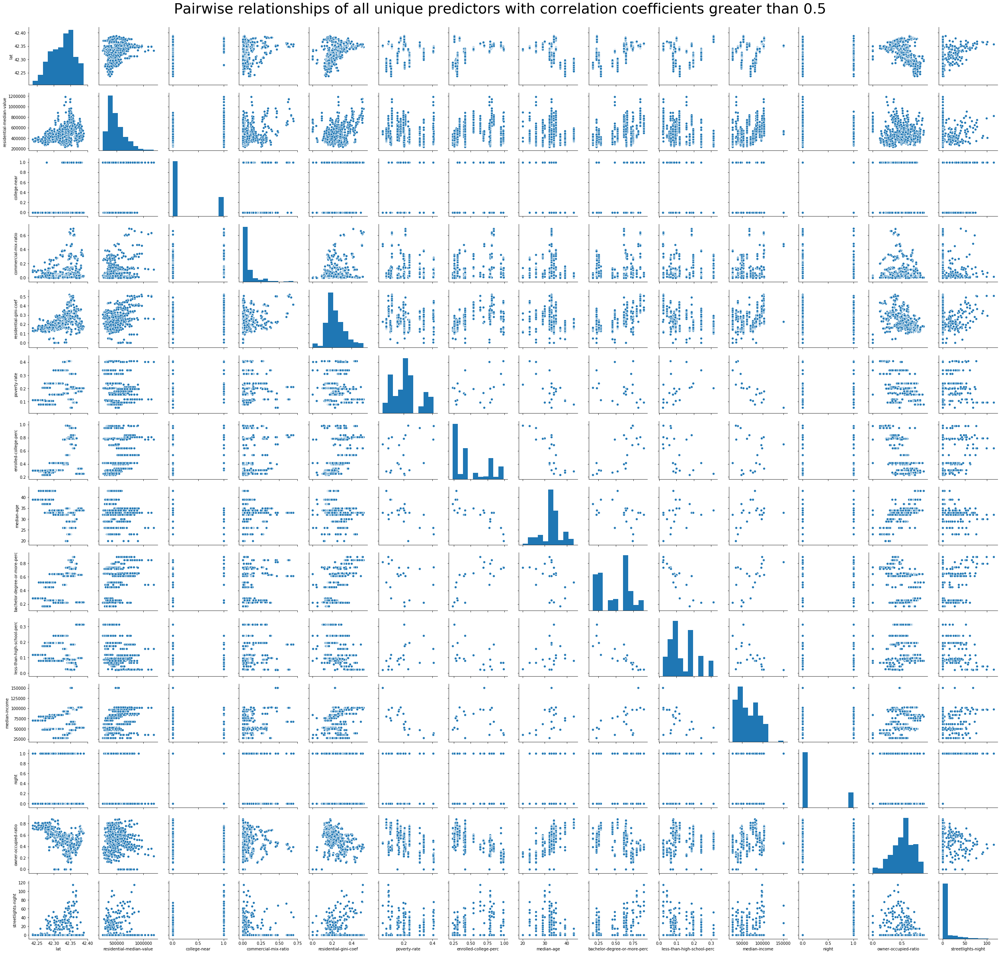

CPU times: user 51.3 s, sys: 39.9 ms, total: 51.4 s
Wall time: 51.4 s


In [41]:
%%time

savefig = True

# add tract-year match ids to identify unique numeric values in predictors
X_train_labels['tract_match_id'] = X_train_labels['TRACTCE10'].astype(str) +\
                                   X_train_labels['year'].astype(str) 

len_list = len(corr_50_list)
agg_dict = dict(zip(corr_50_list, ['first']*len_list))

# create dataframe of unique values, this will speed up plotting by removing duplicate values
unique_values_df = X_train_labels.groupby('tract_match_id').agg(agg_dict)

# plot a scatter matrix of unique values for each predictor
fig = plt.figure(figsize=(25,25))
# sns.set_context(font_scale=12, rc={"axes.labelsize":10})
sns.pairplot(unique_values_df)
plt.suptitle(
    'Pairwise relationships of all unique predictors with correlation '\
    'coefficients greater than {}'.format(threshold),
    fontsize=36
)
plt.tight_layout(rect=[0, 0.03, 1, 0.96])
if savefig:
    plt.savefig(os.path.join(FIGURES_ROOT, 'correlation-scatter-matrix-most-correlated-predictors.png'))
plt.show();